# X-ray Image Classification for Pneumonia using Convolutional Neural Network

## Project Overview

The purpose of this project is to use convolutional neural network to classify chest X-ray images of normal and pneumonia cases. The dataset used for this image classification analysis is from Kaggle (https://www.kaggle.com/paultimothymooney/chest-xray-pneumonia). 

There are three directories in this dataset, which include: train, test, and validation. The train directory has 5216 jpg images (NORMAL: 1341, PNEUMONIA: 3875), the test directory has 624 jpg images (NORMAL: 234, PNEUMONIA: 390), and validation directory has 16 (NORMAL: 8, PNEUMONIA: 8). Under each directory, there are two categories: NORMAL and PNEUMONIA, where PNEUMONIA can be further splitted into bacterial pneumonia and viral pneumonia. 

However, considering the images included in the validation directory is quite small, I first combined all the images from train, test, and validation directories, and splited them into model set (80%) and testing set (20%), then further splited the model set into training set (80%) and validation set (20%). So the final training, testing, and validation sets include 3747, 1172, and 937 images, respectively. 

# Exploratory Data Analysis

- Import libraries

In [1]:
import os
import glob
import h5py
import shutil
import imgaug as aug
import numpy as np
import pandas as pd
import seaborn as sns
import keras
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import imgaug.augmenters as iaa

from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from PIL import Image
from pathlib import Path
from skimage.io import imread
from skimage.transform import resize

from keras import models, layers
from keras.models import Sequential, Model, load_model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten
from keras.layers.normalization import BatchNormalization
from keras.layers.merge import Concatenate
from keras.optimizers import Adam, SGD, RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping

import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, recall_score, precision_score
from mlxtend.plotting import plot_confusion_matrix

import cv2
from keras import backend as K

color = sns.color_palette()

%matplotlib inline
%load_ext pycodestyle_magic
%flake8_on

Using TensorFlow backend.


In [2]:
# Create augmented image generator for training, testing, and validation directories
generator = ImageDataGenerator(
    rescale=1./255, rotation_range=5,
    width_shift_range=0.1, height_shift_range=0.05,
    shear_range=0.1, zoom_range=0.15,
    horizontal_flip=True, vertical_flip=True,
    fill_mode="reflect")

In [3]:
# Import images from training directory
training_data = generator.flow_from_directory(
    '../input/chest_xray/chest_xray/train',
    target_size=(224, 224),
    batch_size=6000,
    seed=23)

Found 5216 images belonging to 2 classes.


In [4]:
# 0 is pneumonia case, 1 is normal case
training_images, training_labels = next(training_data)
training_images.shape, training_labels.shape

((5216, 224, 224, 3), (5216, 2))

In [5]:
# Import images from testing directory
testing_data = generator.flow_from_directory(
    '../input/chest_xray/chest_xray/test',
    target_size=(224, 224),
    batch_size=6000,
    seed=23)

Found 624 images belonging to 2 classes.


In [6]:
# 0 is pneumonia case, 1 is normal case
testing_images, testing_labels = next(testing_data)
testing_images.shape, testing_labels.shape

((624, 224, 224, 3), (624, 2))

In [7]:
# Import images from validation directory
validation_data = generator.flow_from_directory(
    '../input/chest_xray/chest_xray/val',
    target_size=(224, 224),
    batch_size=6000,
    seed=23)

Found 16 images belonging to 2 classes.


In [8]:
# 0 is pneumonia case, 1 is normal case
validation_images, validation_labels = next(validation_data)
validation_images.shape, validation_labels.shape

((16, 224, 224, 3), (16, 2))

In [9]:
# Combine images of training, testing, and validation directories
images = np.concatenate((training_images, testing_images, validation_images))

In [10]:
images.shape

(5856, 224, 224, 3)

In [11]:
# Combine labels of training, testing, and validation directories
labels = np.concatenate((training_labels[:, 0], testing_labels[:, 0], validation_labels[:, 0]))

In [12]:
labels.shape

(5856,)

In [13]:
labels

array([1., 1., 0., ..., 0., 1., 1.], dtype=float32)

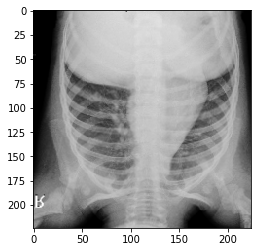

1.0


In [14]:
# Sample image
plt.imshow(images[0])
plt.title
plt.show()
print(labels[0])

In [15]:
# Split the data into model and testing sets
from sklearn.model_selection import train_test_split
X_model, X_test, y_model, y_test = train_test_split(images, labels, test_size=0.20, random_state=23)

In [16]:
# Split the model set into training and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_model, y_model, test_size=0.20, random_state=23)

In [17]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape, X_val.shape, y_val.shape

((3747, 224, 224, 3),
 (3747,),
 (1172, 224, 224, 3),
 (1172,),
 (937, 224, 224, 3),
 (937,))

In [20]:
y_train.mean()

0.26554576

In [31]:
unique, counts = np.unique(y_train, return_counts=True)
np.asarray((unique, counts)).T

array([[0.000e+00, 2.752e+03],
       [1.000e+00, 9.950e+02]])

In [21]:
y_test.mean()

0.27901024

In [32]:
unique, counts = np.unique(y_test, return_counts=True)
np.asarray((unique, counts)).T

array([[  0., 845.],
       [  1., 327.]])

In [22]:
y_val.mean()

0.27854857

In [33]:
unique, counts = np.unique(y_val, return_counts=True)
np.asarray((unique, counts)).T

array([[  0., 676.],
       [  1., 261.]])

In [ ]:
# the ratio of normal to pneumonia cases in all training, testing, and validation sets is around 1:3

## 1. Necessary functions

In [34]:
# Function for model accuracy
def model_acc(model):
    plt.figure(figsize=(8, 6))
    plt.plot(model.history.history['accuracy'])
    plt.plot(model.history.history['val_accuracy'])
    plt.title('Model Accuracy', fontsize=20)
    plt.ylabel('Accuracy', fontsize=14)
    plt.xlabel('Epoch', fontsize=14)
    plt.legend(['Training set', 'Validation set'], loc='lower right', fontsize=12)
    plt.show()

8:80: E501 line too long (82 > 79 characters)


In [44]:
# Function for model loss
def model_loss(model):
    plt.figure(figsize=(8, 6))
    plt.plot(model.history.history['val_loss'])
    plt.plot(model.history.history['loss'])
    plt.title('Model Loss', fontsize=20)
    plt.ylabel('Loss', fontsize=14)
    plt.xlabel('Epoch', fontsize=14)
    plt.legend(['Training set', 'Validation set'], loc='upper right', fontsize=12)
    plt.show()

8:80: E501 line too long (82 > 79 characters)


In [58]:
# Function for roc-auc curve
def roc_auc_plot(model):
    prediction = model.predict(X_test)
    fpr, tpr, threshold = metrics.roc_curve(y_test, prediction)
    roc_auc = metrics.auc(fpr, tpr)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [94]:
# Function for finding the threshold
def find_best_roc_auc_curve(prediction, num_thres=100, p_fp=1, p_tn=0, p_tp=-1, p_fn=100):
    _thres = []
    tpr = []
    fpr = []
    cost = []

    for thres in np.linspace(0.01, 1, num_thres):
        _thres.append(thres)
        predicts = np.zeros((prediction.shape[0], 1))
        predicts[np.where(prediction[:, ] >= thres)] = 1

        conf_matrix = confusion_matrix(y_test, predicts)

        tp = conf_matrix[1, 1]
        tn = conf_matrix[0, 0]
        fp = conf_matrix[0, 1]
        fn = conf_matrix[1, 0]

        sensitivity = tp / (tp + fn)
        tnr = specificity = tn / (tn + fp)
        fnr = 1 - sensitivity

        tpr.append(sensitivity)
        fpr.append(1 - specificity)
    # add a cost function (this involves domain knowledge)
        current_cost = (p_fp * fp) + (p_tn * tn) + (p_tp * tp) + (p_fn * fn)
        cost.append(current_cost)

        print("Recall of the model is {:.2f}".format(recall))
        print("Precision of the model is {:.2f}".format(precision))
        print("threshold is {:.2f}".format(thres))
        print("cost function is {:.2f}".format(current_cost))

1:80: E501 line too long (90 > 79 characters)
20:9: F841 local variable 'tnr' is assigned to but never used
21:9: F841 local variable 'fnr' is assigned to but never used


In [96]:
# Function for best roc-auc curve
def best_roc_auc_plot():
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [98]:
# Function for confusion matrix
def build_cm(model, thres, prediction):
    prediction = prediction.reshape(1172)

    results = pd.DataFrame({'predict': prediction, 'actual': y_test})

    results.loc[results['predict'] >= thres, 'predict'] = 1
    results.loc[results['predict'] < thres, 'predict'] = 0

    cm = confusion_matrix(results['actual'], results['predict'])
    plt.figure(figsize=(15, 9))
    sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square=True, cmap='Blues_r')
    plt.ylabel('Actual', fontsize=14)
    plt.xlabel('Predicted', fontsize=14)
    plt.title("Confusion Matrix", fontsize=20)

11:80: E501 line too long (86 > 79 characters)


## 2. Transfer learning--VGG16 with convolutional neural network

In [125]:
# Import VGG16 model
from keras.applications.vgg16 import VGG16
model = VGG16(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

In [126]:
for pre_trained_layer in model.layers:
    pre_trained_layer.trainable = False

In [127]:
# Drop the original last layer
last_layer = model.layers[-1]
last_output = last_layer.output

In [128]:
# Change the multi-class classification to binary classification
x = Flatten()(last_output)
x = Dense(512, activation='relu')(x)
x = Dense(1, activation='sigmoid')(x)
model = Model(model.input, x)

In [129]:
print(model.summary())

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [130]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [131]:
model.fit(X_train, y_train, epochs=10, batch_size=200, validation_data=(X_val, y_val))

Train on 3747 samples, validate on 937 samples
Epoch 1/10
3747/3747 [==============================] - 822s 219ms/step - loss: 1.4784 - accuracy: 0.7393 - val_loss: 0.3105 - val_accuracy: 0.8751
Epoch 2/10
3747/3747 [==============================] - 842s 225ms/step - loss: 0.2532 - accuracy: 0.8973 - val_loss: 0.1779 - val_accuracy: 0.9317
Epoch 3/10
3747/3747 [==============================] - 758s 202ms/step - loss: 0.1762 - accuracy: 0.9301 - val_loss: 0.1693 - val_accuracy: 0.9328
Epoch 4/10
3747/3747 [==============================] - 768s 205ms/step - loss: 0.1306 - accuracy: 0.9517 - val_loss: 0.1521 - val_accuracy: 0.9392
Epoch 5/10
3747/3747 [==============================] - 776s 207ms/step - loss: 0.1108 - accuracy: 0.9642 - val_loss: 0.1687 - val_accuracy: 0.9306
Epoch 6/10
3747/3747 [==============================] - 809s 216ms/step - loss: 0.1049 - accuracy: 0.9634 - val_loss: 0.1578 - val_accuracy: 0.9285
Epoch 7/10
3747/3747 [==============================] - 790s 211m

In [132]:
# Save model weights
model.save_weights('sour_patch_vgg16.h5')

In [432]:
# Save model
model.save('sour_patch_vgg16_model.h5')

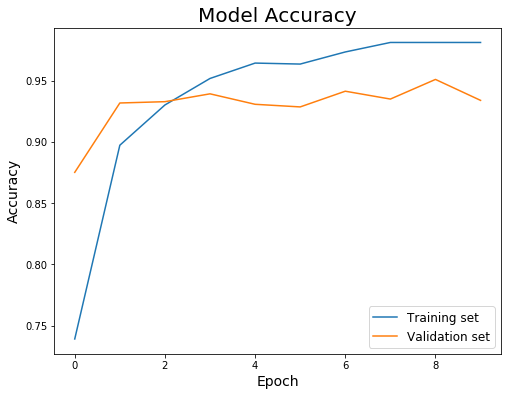

In [138]:
model_acc(model)

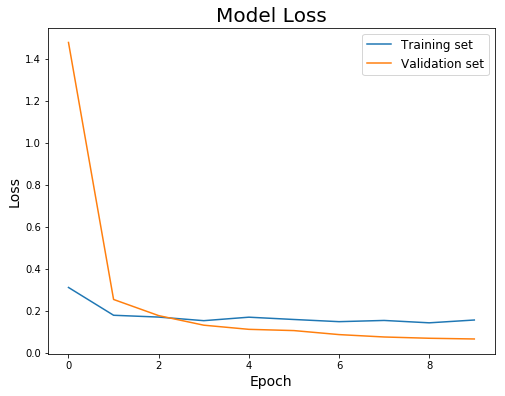

In [139]:
model_loss(model)

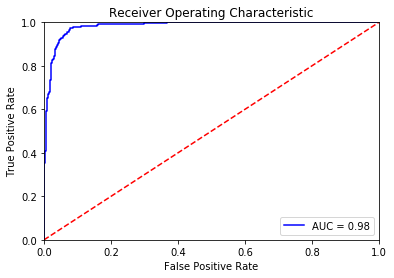

In [157]:
roc_auc_plot(model)

In [141]:
prediction3 = model.predict(X_test)

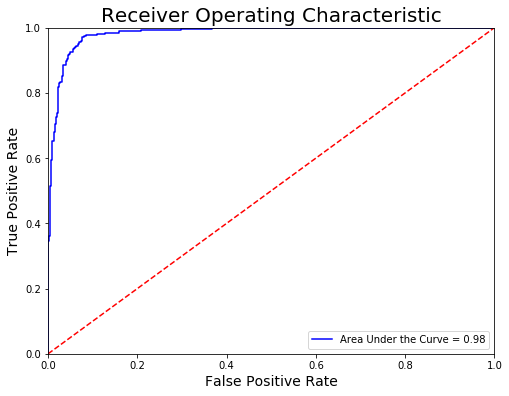

<Figure size 432x288 with 0 Axes>

In [180]:
fpr, tpr, threshold = metrics.roc_curve(y_test, prediction3)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.title('Receiver Operating Characteristic', fontsize=20)
plt.plot(fpr, tpr, 'b', label='Area Under the Curve = %0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)
plt.show()
plt.savefig('vgg16_roc_auc_new.png')

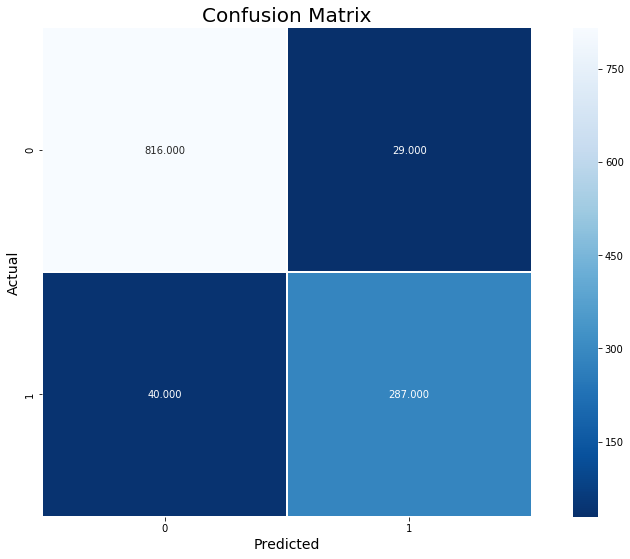

In [149]:
build_cm(model, 0.4, prediction3)

In [151]:
recall = 287/(287 + 40)
recall

0.8776758409785933

In [162]:
precision = 287/(287 + 29)
precision

0.9082278481012658

In [163]:
acc = (816 + 287) / (816 + 29 + 40 + 287)
acc

0.9411262798634812

In [164]:
f1 = 2 * (recall * precision) / (precision + recall)
f1

0.8926905132192845

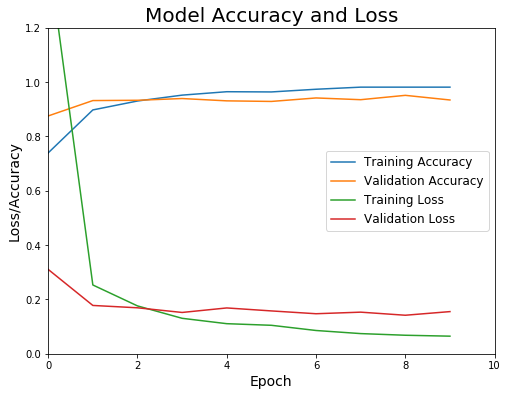

<Figure size 432x288 with 0 Axes>

12:80: E501 line too long (92 > 79 characters)
23:80: E501 line too long (80 > 79 characters)
12:80: E501 line too long (92 > 79 characters)
23:80: E501 line too long (80 > 79 characters)


In [176]:
plt.figure(figsize=(8, 6))
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])

plt.title('Model Accuracy and Loss', fontsize=20)
plt.ylabel('Loss/Accuracy', fontsize=14)
plt.ylim(bottom=0, top=1.2)
plt.xlim(left=0, right=10)
plt.xlabel('Epoch', fontsize=14)
plt.legend(['Training Accuracy', 'Validation Accuracy', 'Training Loss', 'Validation Loss'],
           loc='center right', fontsize=12)
plt.show()
plt.savefig('vgg16_acc_loss.png')

## 3. Layers visualization

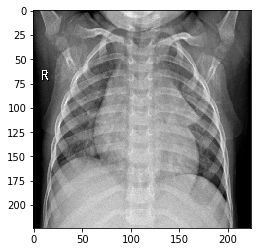

(1, 224, 224, 3)


<Figure size 432x288 with 0 Axes>

1:80: E501 line too long (82 > 79 characters)
1:80: E501 line too long (82 > 79 characters)


In [356]:
img_path = '../input/chest_xray/chest_xray/train/NORMAL/NORMAL2-IM-0962-0001.jpeg'

img = image.load_img(img_path, target_size=(224, 224))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

print(img_tensor.shape)

In [357]:
classes = model.predict(img_tensor, batch_size=10)
for img_class in classes:
    if img_class <= 0.6:
        print("Predicted class: Pneumonia", img_class)
    else:
        print("Predicted class: Normal", img_class)

Predicted class is: Normal [0.9947654]


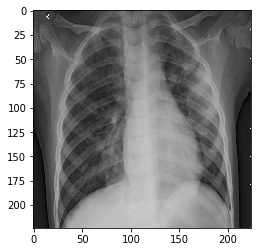

(1, 224, 224, 3)
Predicted class is: Pneumonia [0.02454415]


<Figure size 432x288 with 0 Axes>

1:80: E501 line too long (80 > 79 characters)
1:80: E501 line too long (80 > 79 characters)


In [355]:
img_path = '../input/chest_xray/chest_xray/test/PNEUMONIA/person3_virus_15.jpeg'

img = load_img(img_path, target_size=(224, 224))
img_tensor = img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

print(img_tensor.shape)

classes = model.predict(img_tensor, batch_size=10)
for img_class in classes:
    if img_class <= 0.6:
        print("Predicted class is: Pneumonia", img_class)
    else:
        print("Predicted class is: Normal", img_class)

In [429]:
layer_outputs = [layer.output for layer in model.layers[:18]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

1:62: E261 at least two spaces before inline comment
1:80: E501 line too long (105 > 79 characters)
1:62: E261 at least two spaces before inline comment
1:80: E501 line too long (105 > 79 characters)


In [430]:
activations = activation_model.predict(img_tensor)

In [431]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 3)


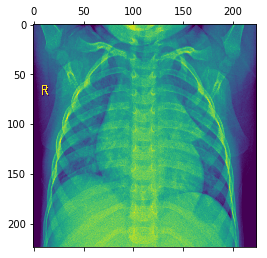

In [417]:
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis')

(1, 224, 224, 64)


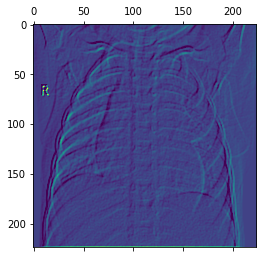

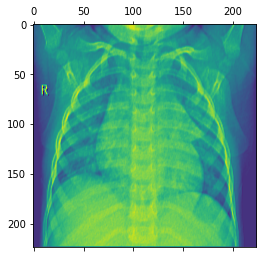

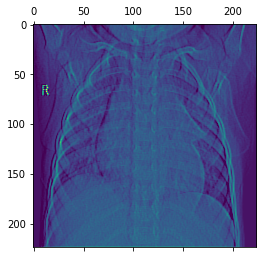

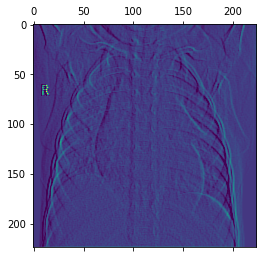

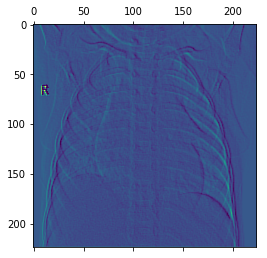

In [418]:
second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.matshow(second_layer_activation[0, :, :, 0], cmap='viridis')
plt.matshow(second_layer_activation[0, :, :, 1], cmap='viridis')
plt.matshow(second_layer_activation[0, :, :, 2], cmap='viridis')
plt.matshow(second_layer_activation[0, :, :, 52], cmap='viridis')
plt.matshow(second_layer_activation[0, :, :, 63], cmap='viridis')

(1, 112, 112, 128)


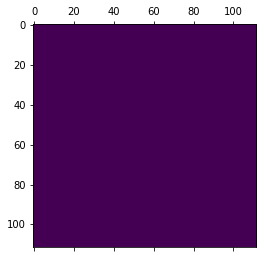

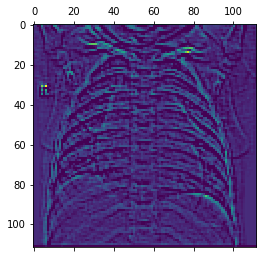

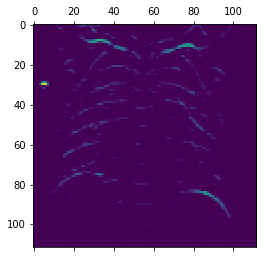

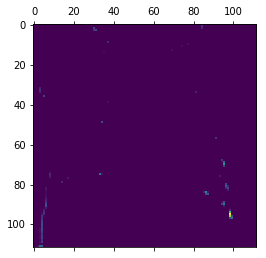

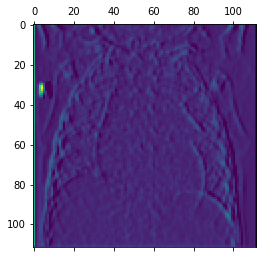

In [419]:
maxpooling_layer_activation = activations[4]
print(maxpooling_layer_activation.shape)

plt.matshow(maxpooling_layer_activation[0, :, :, 0], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 29], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 59], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 89], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 127], cmap='viridis')

(1, 28, 28, 512)


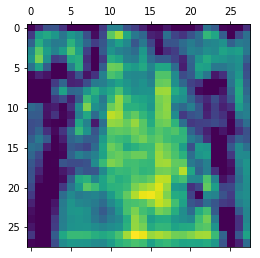

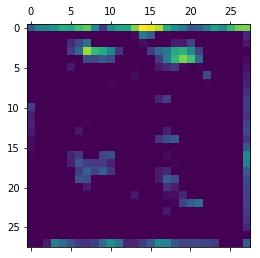

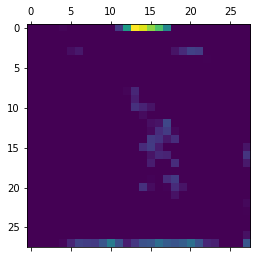

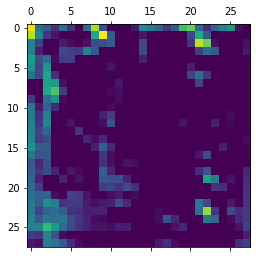

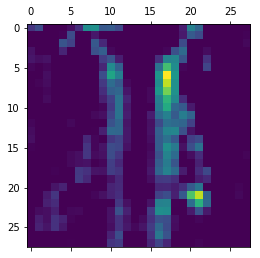

In [420]:
maxpooling_layer_activation = activations[11]
print(maxpooling_layer_activation.shape)

plt.matshow(maxpooling_layer_activation[0, :, :, 0], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 149], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 299], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 449], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 511], cmap='viridis')

(1, 7, 7, 512)


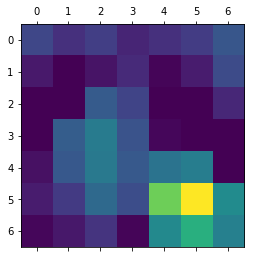

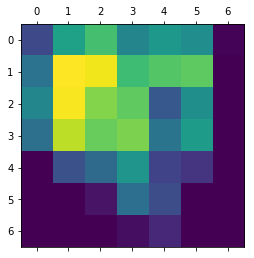

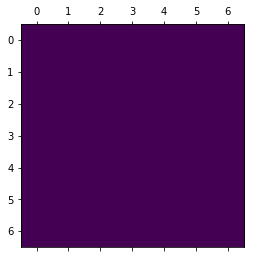

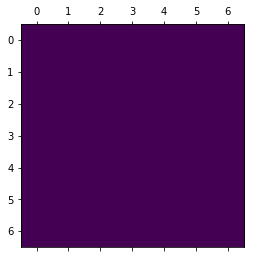

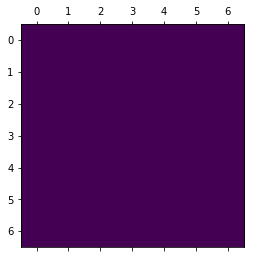

In [428]:
maxpooling_layer_activation = activations[18]
print(maxpooling_layer_activation.shape)

plt.matshow(maxpooling_layer_activation[0, :, :, 0], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 149], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 299], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 449], cmap='viridis')
plt.matshow(maxpooling_layer_activation[0, :, :, 511], cmap='viridis')

/Users/yl/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


RuntimeError: libpng signaled error

<Figure size 1152x0 with 1 Axes>

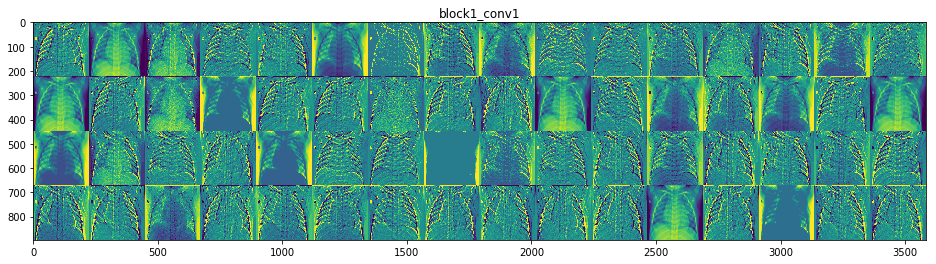

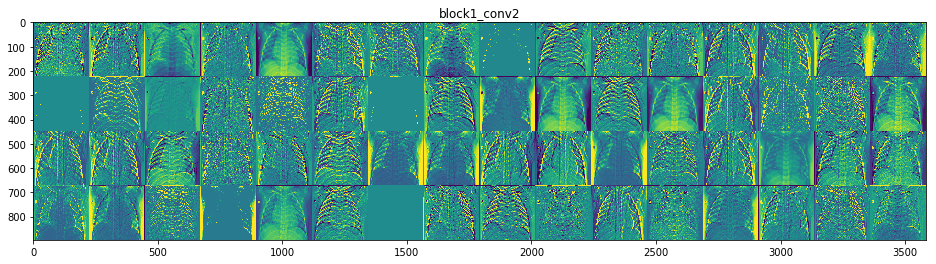

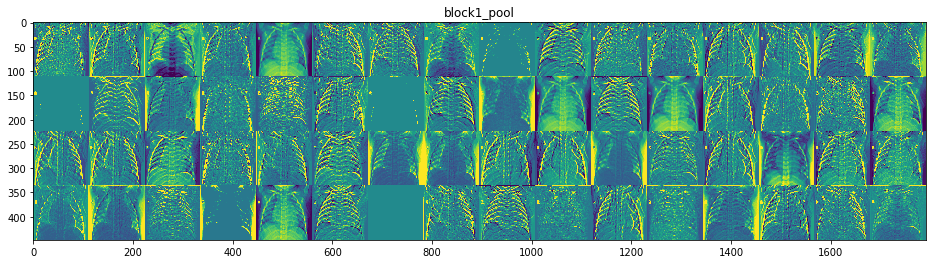

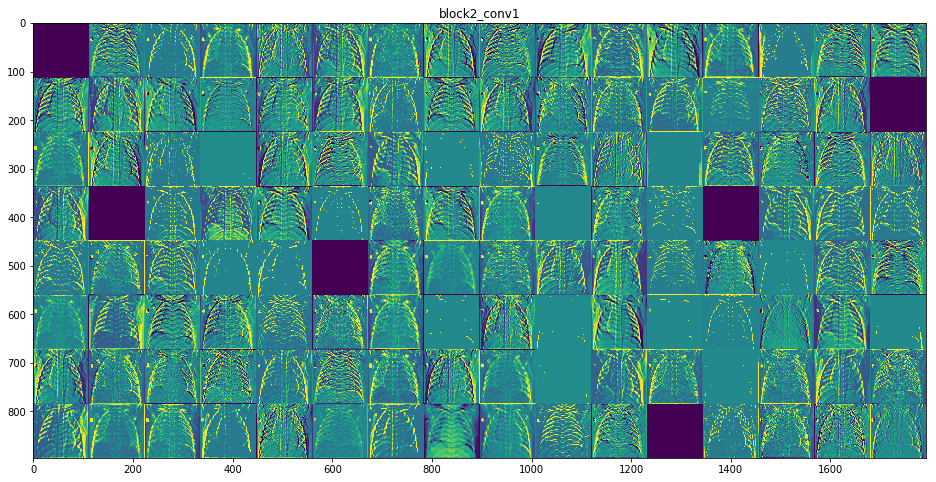

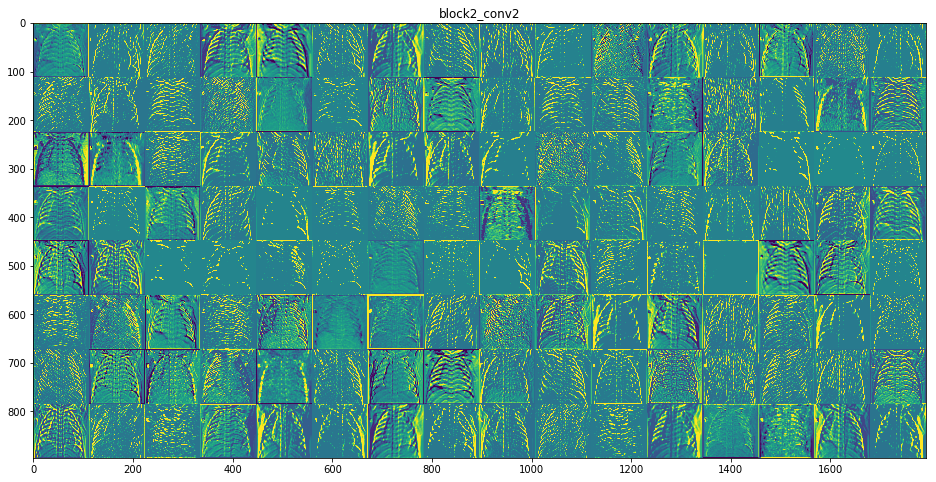

...

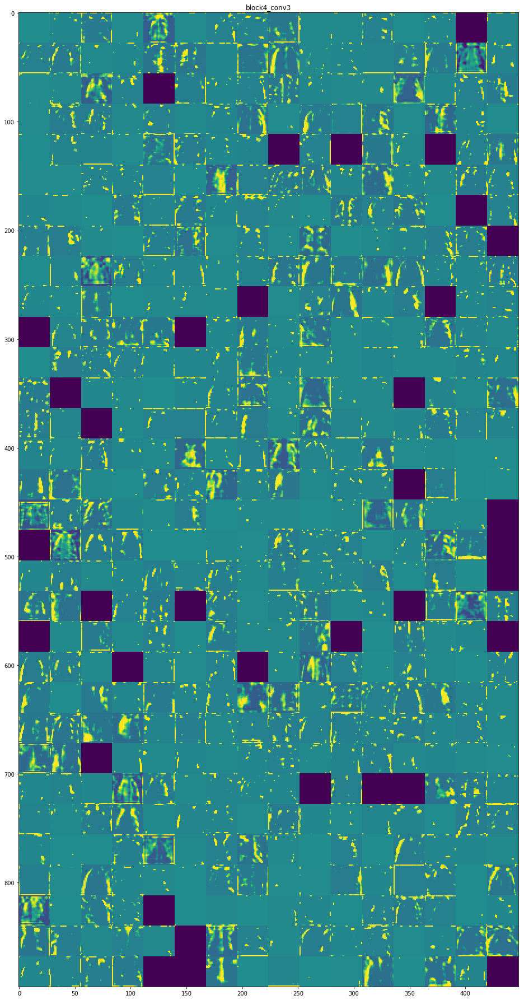

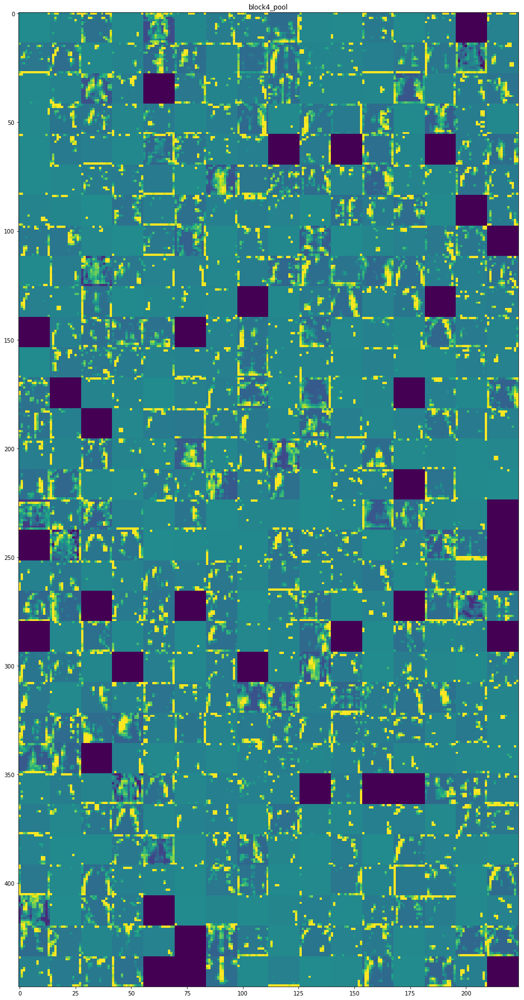

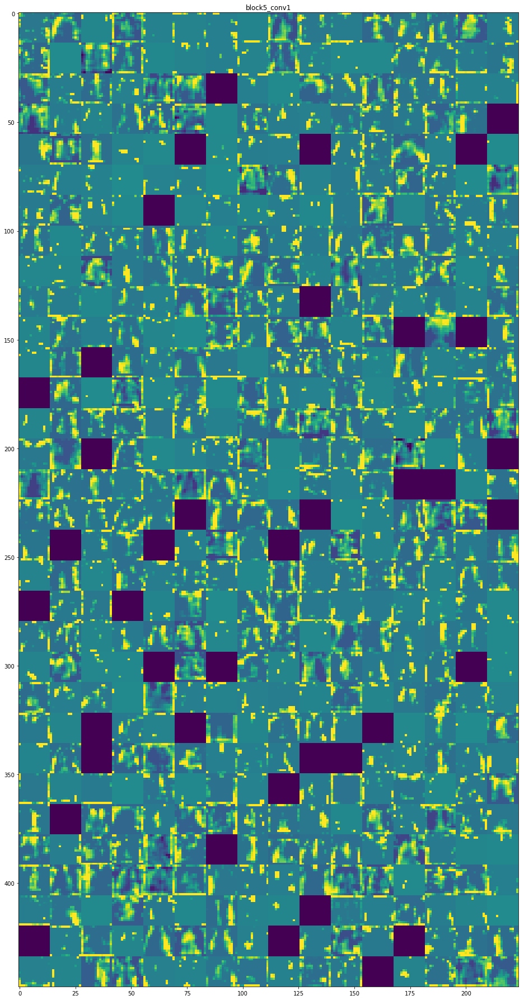

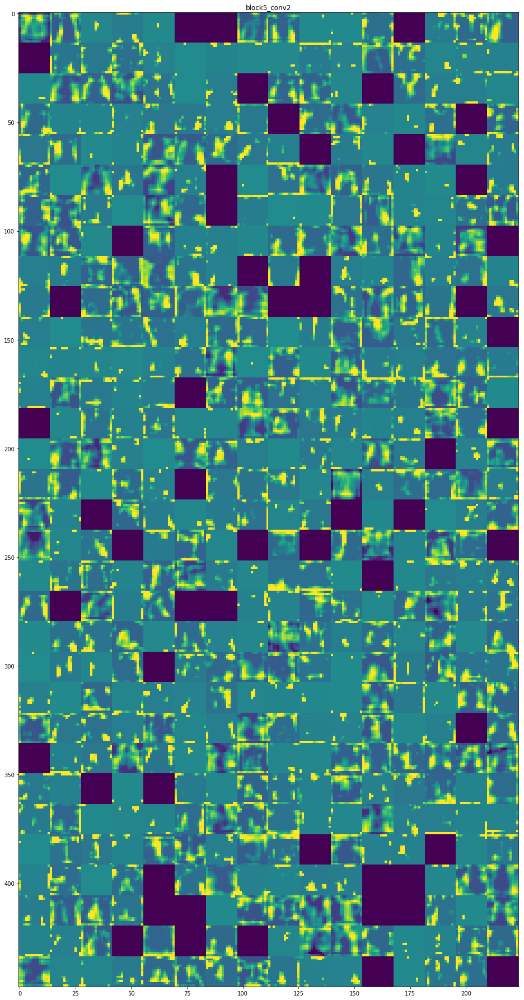

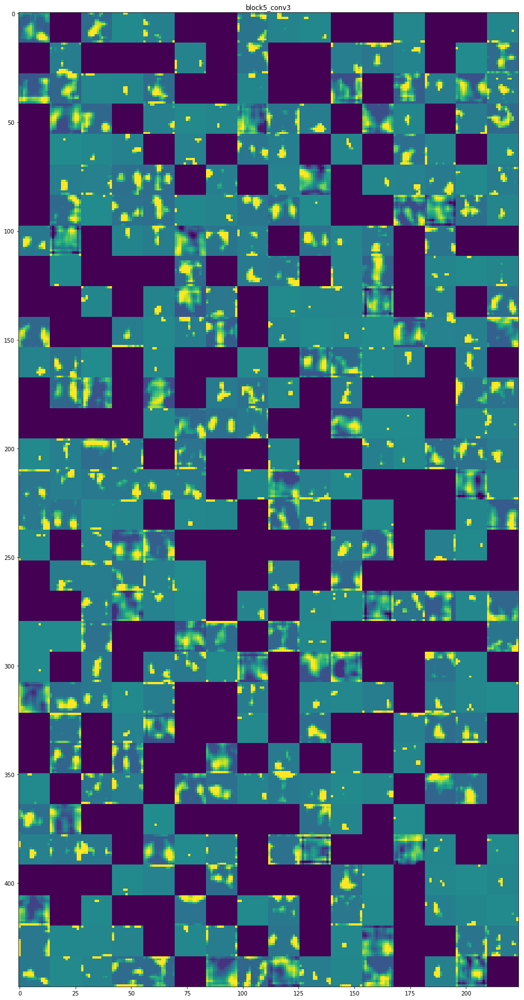

3:35: E261 at least two spaces before inline comment
3:80: E501 line too long (99 > 79 characters)
4:1: W293 blank line contains whitespace
7:67: E261 at least two spaces before inline comment
7:80: E501 line too long (94 > 79 characters)
8:44: E261 at least two spaces before inline comment
8:80: E501 line too long (83 > 79 characters)
9:37: E261 at least two spaces before inline comment
9:38: E262 inline comment should start with '# '
9:80: E501 line too long (92 > 79 characters)
10:42: E261 at least two spaces before inline comment
10:80: E501 line too long (88 > 79 characters)
12:30: E261 at least two spaces before inline comment
17:50: E261 at least two spaces before inline comment
17:80: E501 line too long (108 > 79 characters)
36: E203 whitespace before ':'
22:56: E261 at least two spaces before inline comment
36: E203 whitespace before ':'
3:35: E261 at least two spaces before inline comment
3:80: E501 line too long (99 > 79 characters)
4:1: W293 blank line contains whitespace
7

In [421]:
layer_names = []
for layer in model.layers[:18]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')